Group Assignment Four AG and DH

In [1]:
#Import packages
import geopandas as gpd
import pandas as pd
import plotly.express as px
from sodapy import Socrata
import folium
import matplotlib
import matplotlib.pyplot as plt

In [2]:
#Read in EJSM df and make string of tracts to be named
df = pd.read_csv(
'Data/EJSM_Scores/EJSM_Scores (1).csv' ,
dtype={
    'Tract_1':str
})

In [3]:
#Add number zero leading the FIPS code for merging the data with the census tract data
df['Tract_1'] = df['Tract_1'].str.zfill(11)
df.head()

,OBJECTID,Tract_1,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length
0,1,06037920336,10,3,1,4,2,2.438560e+06,8124.373091
1,2,06037920044,4,1,1,1,1,1.470811e+06,5545.298452
2,3,06037573003,13,5,3,3,2,6.528168e+05,3310.743793
3,4,06037571704,13,3,2,4,4,6.994011e+05,4113.477175
4,5,06037570403,17,5,3,5,4,8.317839e+05,3887.000394


In [4]:
#Import 2012 census data
tracts=gpd.read_file('Data/CensusData2012/census-tracts-2012.geojson')
print(tracts)

                     kind  external_id         name  \
0     Census Tract (2012)  06037101110  06037101110   
1     Census Tract (2012)  06037101122  06037101122   
2     Census Tract (2012)  06037101210  06037101210   
3     Census Tract (2012)  06037101220  06037101220   
4     Census Tract (2012)  06037101300  06037101300   
...                   ...          ...          ...   
2341  Census Tract (2012)  06037980031  06037980031   
2342  Census Tract (2012)  06037980033  06037980033   
2343  Census Tract (2012)  06037990100  06037990100   
2344  Census Tract (2012)  06037990200  06037990200   
2345  Census Tract (2012)  06037990300  06037990300   

                               slug                                    set  \
0     06037101110-census-tract-2012  /1.0/boundary-set/census-tracts-2012/   
1     06037101122-census-tract-2012  /1.0/boundary-set/census-tracts-2012/   
2     06037101210-census-tract-2012  /1.0/boundary-set/census-tracts-2012/   
3     06037101220-census-tr

In [5]:
#List column names 
list(tracts)

['kind',
 'external_id',
 'name',
 'slug',
 'set',
 'metadata',
 'resource_uri',
 'geometry']

In [6]:
#Select unwanted columns
columns_to_drop = ['set','kind','resource_uri','metadata']
#read columns 
tracts.head()

,kind,external_id,name,slug,set,metadata,resource_uri,geometry
0,Census Tract (2012),06037101110,06037101110,06037101110-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2594737', 'NAME': '1011.10',...",/1.0/boundary/06037101110-census-tract-2012/,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,Census Tract (2012),06037101122,06037101122,06037101122-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2677213', 'NAME': '1011.22',...",/1.0/boundary/06037101122-census-tract-2012/,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,Census Tract (2012),06037101210,06037101210,06037101210-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2529724', 'NAME': '1012.10',...",/1.0/boundary/06037101210-census-tract-2012/,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,Census Tract (2012),06037101220,06037101220,06037101220-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2516085', 'NAME': '1012.20',...",/1.0/boundary/06037101220-census-tract-2012/,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,Census Tract (2012),06037101300,06037101300,06037101300-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2487732', 'NAME': '1013', 'I...",/1.0/boundary/06037101300-census-tract-2012/,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [7]:
#Drop unnecessary columns from tracts data
tracts = tracts.drop(columns_to_drop,axis=1)

In [8]:
#Show tracts info
tracts.info(verbose=True, null_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   external_id  2346 non-null   object  
 1   name         2346 non-null   object  
 2   slug         2346 non-null   object  
 3   geometry     2346 non-null   geometry
dtypes: geometry(1), object(3)
memory usage: 73.4+ KB


In [9]:
#Isolate the FIPS code and geometry columns to match with the EJSM data
tracts = tracts[['name','geometry']]
tracts.head()

,name,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [10]:
#Show isolated columns - COULD ADD tracts.columns
tracts.columns = ['FIPS','geometry']
tracts.head()

,FIPS,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [11]:
#Rename Tract_1 to FIPS
df.columns = ['OBJECTID',
 'FIPS',
 'CIscore',
 'HazScore',
 'HealthScore',
 'SVscore',
 'CCVscore',
 'Shape__Area',
 'Shape__Length']
df.head()

,OBJECTID,FIPS,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length
0,1,06037920336,10,3,1,4,2,2.438560e+06,8124.373091
1,2,06037920044,4,1,1,1,1,1.470811e+06,5545.298452
2,3,06037573003,13,5,3,3,2,6.528168e+05,3310.743793
3,4,06037571704,13,3,2,4,4,6.994011e+05,4113.477175
4,5,06037570403,17,5,3,5,4,8.317839e+05,3887.000394


In [12]:
#This section will explore the merged data

In [13]:
#List new df columns
list(df)

['OBJECTID',
 'FIPS',
 'CIscore',
 'HazScore',
 'HealthScore',
 'SVscore',
 'CCVscore',
 'Shape__Area',
 'Shape__Length']

In [14]:
#Merge data on the same object FIPS
tracts_ejsm=tracts.merge(df,on="FIPS")
#Show merge with census data
tracts_ejsm.head()
tracts_ejsm.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2342 entries, 0 to 2341
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   FIPS           2342 non-null   object  
 1   geometry       2342 non-null   geometry
 2   OBJECTID       2342 non-null   int64   
 3   CIscore        2342 non-null   int64   
 4   HazScore       2342 non-null   int64   
 5   HealthScore    2342 non-null   int64   
 6   SVscore        2342 non-null   int64   
 7   CCVscore       2342 non-null   int64   
 8   Shape__Area    2342 non-null   float64 
 9   Shape__Length  2342 non-null   float64 
dtypes: float64(2), geometry(1), int64(6), object(1)
memory usage: 201.3+ KB


In [15]:
tracts_ejsm.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [16]:
#Describe stats by proximity to hazard score
tracts_ejsm['CIscore'].describe()

count    2342.000000
mean       12.007259
std         4.352322
min         0.000000
25%         9.000000
50%        12.000000
75%        15.000000
max        20.000000
Name: CIscore, dtype: float64

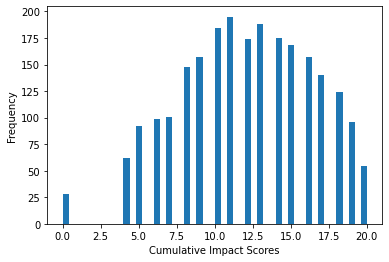

In [17]:
#Plot histogram for cumulative impact score
tracts_ejsm['CIscore'].plot.hist(bins=50),
plt.xlabel('Cumulative Impact Scores')
plt.ylabel('Frequency'),
plt.savefig('CIscore.png')

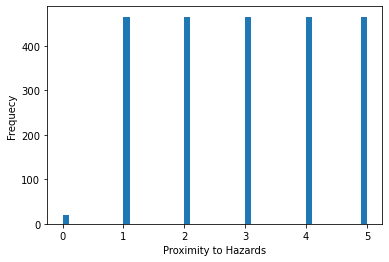

In [18]:
#Plot histogram for proximity to hazard score. It is grouped by the number of occurences. 
#Our not so great graph! Seeing this bar chart intrigued us to durther explore the variations between census tracts.
tracts_ejsm['HazScore'].plot.hist(bins=50)
plt.xlabel('Proximity to Hazards')
plt.ylabel('Frequecy'),
plt.savefig('HazScore_bar.png')

It’s unclear why the hazard score data is not distributed the same way as the cumulative impact score data. We wondered if it was because we had miswritten it or if the hazard occurrences were not visible on this bar graph. What is apparent is the average cumulative impact score of LA lying somewhere between 10.5-12.5. The cumulative score considers all the scores identified from the dataset included proximity to hazards, social vulnerability, climate vulnerability, and health vulnerability. 

In [19]:
#New object to show the sorted data- these are the top polluted census tracts. The census tracts that are shown as being the most polluted are also the most socially vulnerable.
tracts_ejsm_sorted = tracts_ejsm.sort_values(by='CIscore',ascending = False)
tracts_ejsm_sorted[['FIPS','CIscore','HazScore','SVscore']].head(10)

,FIPS,CIscore,HazScore,SVscore
1325,06037433501,20,5,5
1530,06037530301,20,5,5
594,06037211922,20,5,5
532,06037206032,20,5,5
533,06037206050,20,5,5
660,06037219300,20,5,5
581,06037211310,20,5,5
672,06037221302,20,5,5
719,06037228900,20,5,5
1637,06037535605,20,5,5


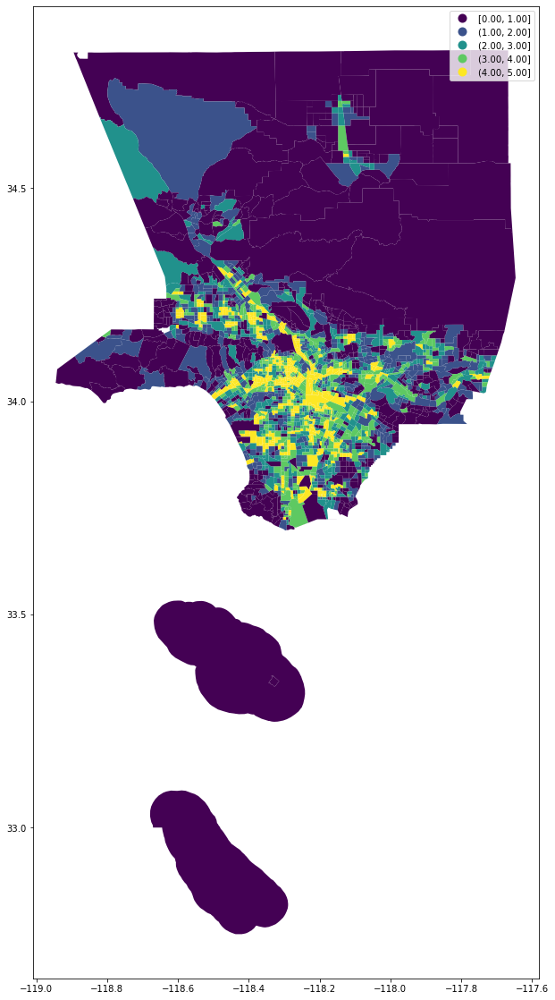

In [20]:
#Plot represents the proximity to environmental hazards score by equal intervals 
#We can see that the most polluted areas are in south central LA county 
tracts_ejsm.plot(figsize=(24,20),
                 column='HazScore',
                 legend=True, 
                 scheme='equal_interval')

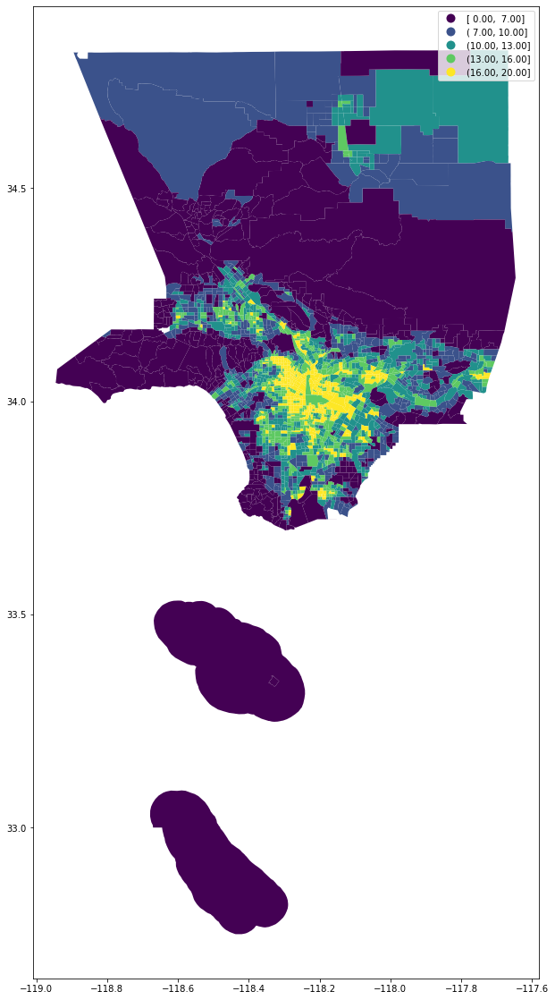

In [21]:
#Plot represents the cumulative impact scores separated by natural breaks
#The map shows increased variation because of the integrated scores
tracts_ejsm.plot(figsize=(24,20),
                 column='CIscore',
                 legend=True, 
                 scheme='NaturalBreaks')

This Chloropleth map provides us with a background map that will kick off the rest of our work. We chose hazard scores because while the cumulative impact was meaningful, we wanted to focus on a standard that could be more decisively measured (proximity to environmental hazards in the form of pollutants) rather than other measurements. Measurements include a social vulnerability that could be more skewed based on indicators defined by the source (in this case, USC/Occidental College). For example, although poverty and policing can be linked, we wanted to see if sites that were contaminated or close to toxic sites (such as Exide) would have a significant relationship to policing.

<div class="alert alert-danger">
There is a problem with the way you are importing the data. You have a limit of 10,000 records (this can be upped to 50,000), and you do not sort the data in any way. The resulting data is a subset of records of the total.
    
Consider instead to specify a date range and a query that makes the data fall under the 50000 record limit.

I provide an example below (df2) for your reference.
</div>

In [22]:
#Importing our arrest 2020 data using an API
client = Socrata("data.lacity.org", None)
results = client.get("amvf-fr72", 
                     limit=50000,
                     where = "(arst_date between '2020-01-01T00:00:00' and '2020-10-30T00:00:00') AND (grp_description in ('Aggravated Assault','Miscellaneous Other Violations','Driving Under Influence','Other Assaults','Narcotic Drug Laws'))",
                     order='arst_date desc')
df =pd.DataFrame.from_records(results)

In [23]:
df.shape

(28093, 25)

<div class="alert alert-danger">
This example limits the import to certain crime types (look at the list within the where statement). Adjust these as necessary.
</div>

In [24]:
#Sample data to check for inconsistencies
df.sample(7)

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,dispo_desc,location,lat,lon,location_1,bkg_date,bkg_time,bgk_location,bkg_loc_cd,crsst
28035,5835721,BOOKING,2020-01-01T00:00:00.000,0215,01,Central,0157,40,M,H,...,MISDEMEANOR COMPLAINT FILED,SAN PEDRO,34.0407,-118.2468,"{'type': 'Point', 'coordinates': [-118.2468, 3...",2020-01-01T00:00:00.000,0321,METRO - JAIL DIVISION,4273,7TH
21046,5883422,BOOKING,2020-02-23T00:00:00.000,1650,13,Newton,1361,23,F,B,...,FELONY COMPLAINT FILED,BROADWAY,34.0029,-118.2783,"{'type': 'Point', 'coordinates': [-118.2783, 3...",2020-02-23T00:00:00.000,1914,METRO - JAIL DIVISION,4273,45TH ST
15738,5914868,BOOKING,2020-04-13T00:00:00.000,1200,18,Southeast,1823,26,M,B,...,FELONY COMPLAINT FILED,103RD ST,33.9429,-118.2652,"{'type': 'Point', 'coordinates': [-118.2652, 3...",2020-04-13T00:00:00.000,1326,77TH ST,4212,AVALON BL
22159,5875705,BOOKING,2020-02-14T00:00:00.000,2100,09,Van Nuys,0906,36,M,H,...,MISDEMEANOR COMPLAINT FILED,7400 VAN NUYS BL,34.2048,-118.4488,"{'type': 'Point', 'coordinates': [-118.4488, 3...",2020-02-14T00:00:00.000,2345,VALLEY - JAIL DIV,4279,NaN
3145,5999122,BOOKING,2020-08-25T00:00:00.000,1915,11,Northeast,1162,36,M,O,...,849(B)(1) PC/TECHNICAL ARREST,1300 N VERMONT AV,34.0956,-118.2918,"{'type': 'Point', 'coordinates': [-118.2918, 3...",2020-08-25T00:00:00.000,2333,HOLLYWOOD,4206,NaN
610,6014825,BOOKING,2020-09-18T00:00:00.000,2220,05,Harbor,0557,51,M,H,...,MISDEMEANOR COMPLAINT FILED,6TH ST,33.7388,-118.2902,"{'type': 'Point', 'coordinates': [-118.2902, 3...",2020-09-18T00:00:00.000,2324,HARBOR,4205,GRAND AV
5530,5983604,BOOKING,2020-08-02T00:00:00.000,1130,19,Mission,1969,47,M,H,...,MISDEMEANOR COMPLAINT FILED,OSBORNE ST,34.2433,-118.4245,"{'type': 'Point', 'coordinates': [-118.4245, 3...",2020-08-02T00:00:00.000,1447,VALLEY - JAIL DIV,4279,BARTEE AV


In [25]:
#Get description of arrest data 
df.grp_description.unique()

array(['Narcotic Drug Laws', 'Miscellaneous Other Violations',
       'Other Assaults', 'Driving Under Influence', 'Aggravated Assault'],
      dtype=object)

In [26]:
#Examining all data types in the df for floats
df.lon = df.lon.astype('float')
df.lat = df.lat.astype('float')

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28093 entries, 0 to 28092
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   rpt_id           28093 non-null  object 
 1   report_type      28093 non-null  object 
 2   arst_date        28093 non-null  object 
 3   time             28093 non-null  object 
 4   area             28093 non-null  object 
 5   area_desc        28093 non-null  object 
 6   rd               28093 non-null  object 
 7   age              28093 non-null  object 
 8   sex_cd           28093 non-null  object 
 9   descent_cd       28093 non-null  object 
 10  chrg_grp_cd      28093 non-null  object 
 11  grp_description  28093 non-null  object 
 12  arst_typ_cd      28093 non-null  object 
 13  charge           28093 non-null  object 
 14  chrg_desc        28093 non-null  object 
 15  dispo_desc       25524 non-null  object 
 16  location         28093 non-null  object 
 17  lat         

<div class="alert alert-danger">
As you can see, the plot below paints a different picture.
</div>

In [28]:
#Plotly bar graph to examine the total arrests by LAPD in 2020
px.bar(df,
       x='arst_date',
       title='LAPD Arrests in 2020',
       labels={'arst_date':'Arrest date','counts':'Number of arrests'}
      ) 

This has been a graph circulating, but it’s interesting to note how arrests boom in the summer months and the moments leading up to it due to the uprisings. What would these look like across time? When hearing about the ‘92 uprising, a familiar anecdote is how heat and power shortages aggravated communities already frustrated and fed up with the policing system. While it’s hard to test this, it’s important to note how many people, particularly folks of color, we’re stuck at home due to quarantine during summer, and many lacked air conditioning (or income to pay for utilities).

In [29]:
#Index arrest charge value counts
arrest_by_charge = df.grp_description.value_counts().reset_index()
arrest_by_charge

,index,grp_description
0,Miscellaneous Other Violations,7802
1,Aggravated Assault,6227
2,Narcotic Drug Laws,4909
3,Driving Under Influence,4651
4,Other Assaults,4504


In [30]:
#Index arrest charge value counts
arrest_by_charge = df.grp_description.value_counts().reset_index()
arrest_by_charge

,index,grp_description
0,Miscellaneous Other Violations,7802
1,Aggravated Assault,6227
2,Narcotic Drug Laws,4909
3,Driving Under Influence,4651
4,Other Assaults,4504


In [31]:
#Configure geometry for crime geodataframe
crime = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lon, df.lat))
crime.drop(crime[crime.lon==0].index,inplace=True)

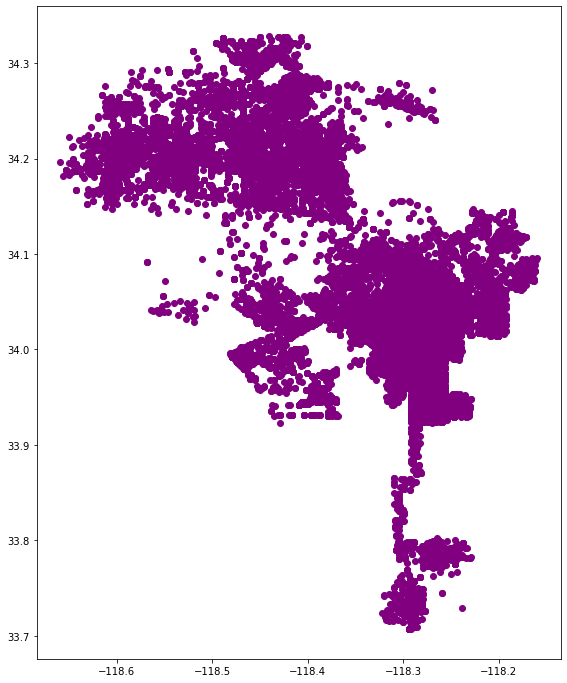

In [32]:
#Scatterplot of crime data
crime.plot(figsize=(12,12),color='purple')

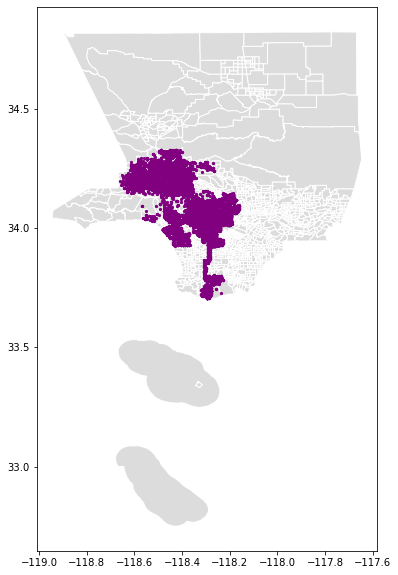

In [33]:
#Add base from tracts data
base = tracts_ejsm.plot(figsize=(12,10),color='gainsboro', edgecolor='white')

ax = crime.plot(ax=base, color='purple', markersize=5)

In [34]:
#Print total bounds of data points 
minx, miny, maxx, maxy = crime.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-118.659
-118.1598
33.707
34.3283


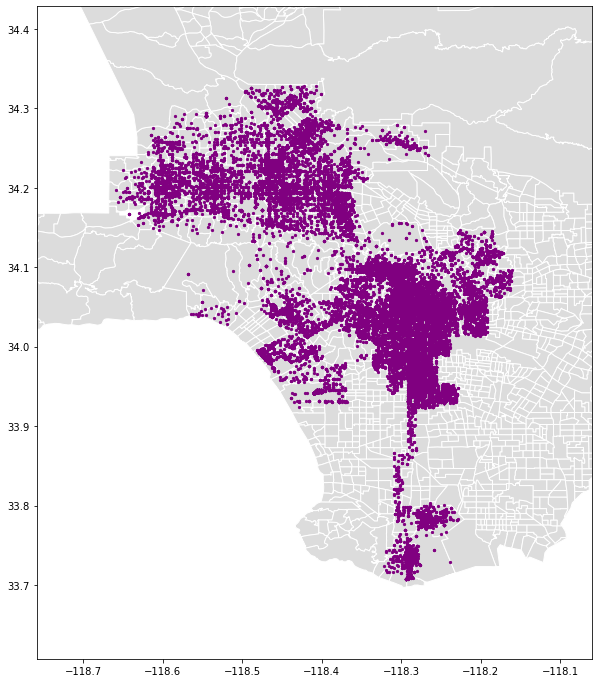

In [35]:
#Print map with within closer boundaries
base = tracts_ejsm.plot(figsize=(12,12),color='gainsboro', edgecolor='white')
ax = crime.plot(ax=base, marker='o', color='purple', markersize=5)
ax.set_xlim(minx - .1, maxx + .1)
ax.set_ylim(miny - .1, maxy + .1)
ax

In [36]:
#Configure coordinate reference system for tracts to join the two dataframes
tracts_ejsm.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [37]:
#Configure coordinate reference system for crime
crime.set_crs(epsg=4326, inplace=True)
crime.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [38]:
#Join tracts_ejsm and crime data
join = gpd.sjoin(tracts_ejsm,
                 crime,
                 how='right')

In [39]:
join.head()

,index_left,FIPS,OBJECTID,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length,...,location,lat,lon,location_1,bkg_date,bkg_time,bgk_location,bkg_loc_cd,crsst,geometry
2018,0.0,06037101110,1464.0,10.0,3.0,1.0,3.0,3.0,1.677572e+06,5561.28341,...,7700 FOOTHILL BL,34.2567,-118.3002,"{'type': 'Point', 'coordinates': [-118.3002, 3...",2020-09-05T00:00:00.000,0218,VALLEY - JAIL DIV,4279,NaN,POINT (-118.30020 34.25670)
22271,0.0,06037101110,1464.0,10.0,3.0,1.0,3.0,3.0,1.677572e+06,5561.28341,...,FOOTHILL,34.2575,-118.3010,"{'type': 'Point', 'coordinates': [-118.301, 34...",NaN,NaN,NaN,NaN,WYNGATE,POINT (-118.30100 34.25750)
3917,0.0,06037101110,1464.0,10.0,3.0,1.0,3.0,3.0,1.677572e+06,5561.28341,...,7600 MACHREA ST,34.2588,-118.2979,"{'type': 'Point', 'coordinates': [-118.2979, 3...",2020-08-18T00:00:00.000,2009,VALLEY - JAIL DIV,4279,NaN,POINT (-118.29790 34.25880)
4194,0.0,06037101110,1464.0,10.0,3.0,1.0,3.0,3.0,1.677572e+06,5561.28341,...,7400 APPERSON ST,34.2560,-118.2932,"{'type': 'Point', 'coordinates': [-118.2932, 3...",2020-08-16T00:00:00.000,0206,VALLEY - JAIL DIV,4279,NaN,POINT (-118.29320 34.25600)
1387,0.0,06037101110,1464.0,10.0,3.0,1.0,3.0,3.0,1.677572e+06,5561.28341,...,10400 MOUNTAIR AV,34.2578,-118.2932,"{'type': 'Point', 'coordinates': [-118.2932, 3...",2020-09-10T00:00:00.000,1410,VALLEY - JAIL DIV,4279,NaN,POINT (-118.29320 34.25780)


In [40]:
join.sample(5)

,index_left,FIPS,OBJECTID,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length,...,location,lat,lon,location_1,bkg_date,bkg_time,bgk_location,bkg_loc_cd,crsst,geometry
23773,765.0,06037237102,367.0,18.0,4.0,5.0,5.0,4.0,6.699295e+05,3317.057661,...,5900 S HOOVER ST,33.9874,-118.2870,"{'type': 'Point', 'coordinates': [-118.287, 33...",2020-02-02T00:00:00.000,1918,77TH ST,4212,NaN,POINT (-118.28700 33.98740)
162,668.0,06037221110,418.0,17.0,4.0,4.0,4.0,5.0,3.422176e+05,2549.050307,...,VENICE BL,34.0443,-118.2892,"{'type': 'Point', 'coordinates': [-118.2892, 3...",2020-09-23T00:00:00.000,0751,METRO - JAIL DIVISION,4273,WESTMORELAND ST,POINT (-118.28920 34.04430)
25223,569.0,06037209403,1260.0,20.0,5.0,5.0,5.0,5.0,2.018408e+05,1798.540394,...,BURLINGTON,34.0519,-118.2755,"{'type': 'Point', 'coordinates': [-118.2755, 3...",2020-01-24T00:00:00.000,0134,METRO - JAIL DIVISION,4273,JAMES M WOOD,POINT (-118.27550 34.05190)
27886,581.0,06037211310,1269.0,20.0,5.0,5.0,5.0,5.0,2.101178e+05,1840.685213,...,3RD ST,34.0691,-118.2979,"{'type': 'Point', 'coordinates': [-118.2979, 3...",2020-01-02T00:00:00.000,2247,METRO - JAIL DIVISION,4273,ALEXANDRIA AV,POINT (-118.29790 34.06910)
24257,544.0,06037207710,402.0,17.0,5.0,5.0,2.0,5.0,1.600719e+06,6336.760838,...,600 S HOPE ST,34.0495,-118.2563,"{'type': 'Point', 'coordinates': [-118.2563, 3...",2020-01-30T00:00:00.000,0540,METRO - JAIL DIVISION,4273,NaN,POINT (-118.25630 34.04950)


In [41]:
#Subset the data from join
df = pd.DataFrame(join,columns=['arst_date','rpt_id','grp_description','arst_typ_cd','HazScore','CIscore','FIPS','lat','lon','geometry'])
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28225 entries, 2018 to 28050
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   arst_date        28225 non-null  object  
 1   rpt_id           28225 non-null  object  
 2   grp_description  28225 non-null  object  
 3   arst_typ_cd      28225 non-null  object  
 4   HazScore         28021 non-null  float64 
 5   CIscore          28021 non-null  float64 
 6   FIPS             28021 non-null  object  
 7   lat              28225 non-null  float64 
 8   lon              28225 non-null  float64 
 9   geometry         28225 non-null  geometry
dtypes: float64(4), geometry(1), object(5)
memory usage: 2.4+ MB


In [42]:
#Subset of the joined dataframes 
#We are keeping these columns because our analysis focuses on the HazScore and description of the charges
df.head()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry
2018,2020-09-04T00:00:00.000,6005984,Driving Under Influence,M,3.0,10.0,06037101110,34.2567,-118.3002,POINT (-118.30020 34.25670)
22271,2020-02-13T00:00:00.000,201605850,Narcotic Drug Laws,M,3.0,10.0,06037101110,34.2575,-118.3010,POINT (-118.30100 34.25750)
3917,2020-08-18T00:00:00.000,5994330,Aggravated Assault,F,3.0,10.0,06037101110,34.2588,-118.2979,POINT (-118.29790 34.25880)
4194,2020-08-15T00:00:00.000,5992659,Driving Under Influence,F,3.0,10.0,06037101110,34.2560,-118.2932,POINT (-118.29320 34.25600)
1387,2020-09-10T00:00:00.000,6009503,Other Assaults,M,3.0,10.0,06037101110,34.2578,-118.2932,POINT (-118.29320 34.25780)


Here we follow Yoh’s steps more closely, but the aggravated arrests don’t tell us much. We’re trying to figure out crimes linked explicitly to environmental hazards. For now, we want to keep this large dataset because we want to be able to pick them out later depending on what crimes we want to analyze in the nexus with environmental hazards.

In [43]:
#These are the tracts with the highest number of arrests. We included this as a priliminary step to mapping the full counts. 
crime_by_tracts = join.FIPS.value_counts().rename_axis('Tract').reset_index(name='crime_count')
crime_by_tracts.head()

,Tract,crime_count
0,06037980028,699
1,06037206300,487
2,06037207710,262
3,06037207400,231
4,06037128210,224


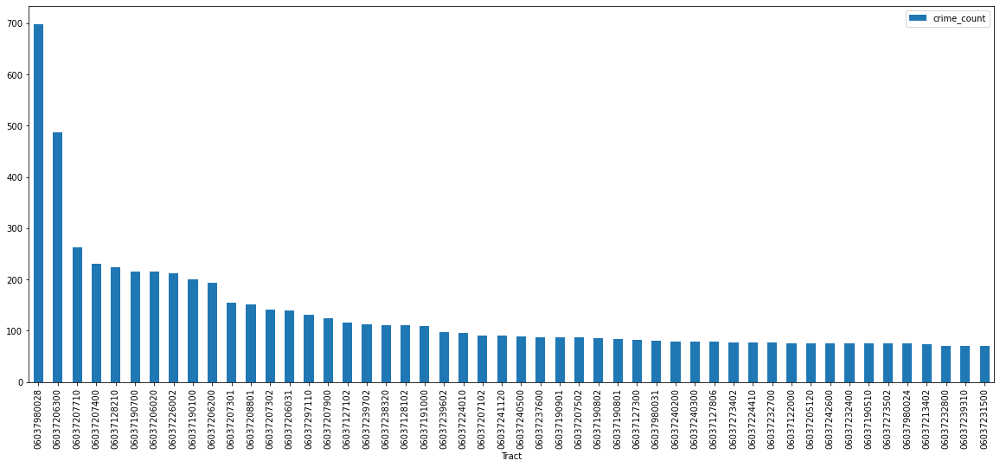

In [44]:
#This is a visualization to compare the amount of arrests in different census tracts
crime_by_tracts[:50].plot.bar(figsize=(20,8),x='Tract',y='crime_count')

This bar graph tells us the crime by census tract, but we can only guess what that is. It would be useful to bring this into the function, but we’re looking for a better way of organizing and visualizing the data. Instead of looking at specific census tracts themselves, our goal is to understand the interconnected relationship between proximity to hazards (such as pollution) and seeing what charges the police are giving people in that area. Surprisingly, the census tract with the most crimes (06037980028) is the one belonging to the airport and in between the Chevron Oil Refinery and the Ballon Wetlands


In [45]:
#Grouped data by the description of arrest. Here, the FIPS out of order because we are descibing a full count of charge descriptions. 
df.groupby(['grp_description']).count()

,arst_date,rpt_id,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry
grp_description,,,,,,,,,
Aggravated Assault,6262,6262,6262,6225,6225,6225,6262,6262,6262
Driving Under Influence,4675,4675,4675,4638,4638,4638,4675,4675,4675
Miscellaneous Other Violations,7847,7847,7847,7785,7785,7785,7847,7847,7847
Narcotic Drug Laws,4921,4921,4921,4876,4876,4876,4921,4921,4921
Other Assaults,4520,4520,4520,4497,4497,4497,4520,4520,4520


In [46]:
#Group data by the FIPS code to explore the meaning of the counts in each census tract. 
df.groupby(['FIPS']).count()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,lat,lon,geometry
FIPS,,,,,,,,,
06037101110,15,15,15,15,15,15,15,15,15
06037101122,5,5,5,5,5,5,5,5,5
06037101210,15,15,15,15,15,15,15,15,15
06037101220,15,15,15,15,15,15,15,15,15
06037101300,9,9,9,9,9,9,9,9,9
...,...,...,...,...,...,...,...,...,...
06037980023,1,1,1,1,1,1,1,1,1
06037980024,75,75,75,75,75,75,75,75,75
06037980026,3,3,3,3,3,3,3,3,3


In [47]:
#Data is grouped for counts of reports in tracts. 
df_grouped=df.groupby(['FIPS','grp_description','lat','lon','arst_date']).count()[['rpt_id']]
df_grouped.head(50)

rpt_id
FIPS        grp_description                lat     lon       arst_date                      
06037101110 Aggravated Assault             34.2588 -118.2979 2020-08-18T00:00:00.000       1
                                           34.2611 -118.2857 2020-06-09T00:00:00.000       1
                                           34.2632 -118.2957 2020-03-05T00:00:00.000       1
            Driving Under Influence        34.2560 -118.2932 2020-08-15T00:00:00.000       1
                                           34.2567 -118.3002 2020-09-04T00:00:00.000       1
            Miscellaneous Other Violations 34.2595 -118.2930 2020-08-16T00:00:00.000       1
            Narcotic Drug Laws             34.2575 -118.3010 2020-02-13T00:00:00.000       1
                                           34.2595 -118.2930 2020-02-05T00:00:00.000       1
                                                             2020-02-18T00:00:00.000       1
                                                             2020-05-15T00:00:00.000       1
                                                             2020-05-21T00:00:00.000       1
            Other Assaults                 34.2578 -118.2932 2020-09-10T00:00:00.000       1
                                           34.2595 -118.2930 2020-02-20T00:00:00.000       1
                                                             2020-06-25T00:00:00.000       1
                                                             2020-07-27T00:00:00.000       1
06037101122 Aggravated Assault             34.2559 -118.2840 2020-04-04T00:00:00.000       1
                                           34.2655 -118.2931 2020-06-02T00:00:00.000       1
            Other Assaults                 34.2632 -118.2943 2020-06-14T00:00:00.000       1
                                           34.2769 -118.2964 2020-03-27T00:00:00.000       1
                                                             2020-04-02T00:00:00.000       1
06037101210 Aggravated Assault             34.2523 -118.2932 2020-06-19T00:00:00.000       1
                                                   -118.2898 2020-06-01T00:00:00.000       1
                                                   -118.2874 2020-06-21T00:00:00.000       1
                                                             2020-07-15T00:00:00.000       1
                                                             2020-08-22T00:00:00.000       1
                                           34.2544 -118.2860 2020-07-26T00:00:00.000       1
            Driving Under Influence        34.2530 -118.2907 2020-02-01T00:00:00.000       1
            Miscellaneous Other Violations 34.2530 -118.2907 2020-03-07T00:00:00.000       2
                                           34.2545 -118.2955 2020-02-07T00:00:00.000       1
                                           34.2551 -118.2964 2020-09-01T00:00:00.000       1
            Narcotic Drug Laws             34.2523 -118.2886 2020-09-08T00:00:00.000       1
            Other Assaults                 34.2523 -118.2898 2020-05-13T00:00:00.000       1
                                           34.2542 -118.2943 2020-01-09T00:00:00.000       1
                                                   -118.2932 2020-04-23T00:00:00.000       1
06037101220 Aggravated Assault             34.2476 -118.2794 2020-05-24T00:00:00.000       1
                                           34.2516 -118.2816 2020-07-01T00:00:00.000       1
                                           34.2520 -118.2835 2020-07-01T00:00:00.000       1
                                           34.2539 -118.2814 2020-09-19T00:00:00.000       1
                                           34.2559 -118.2840 2020-04-04T00:00:00.000       1
            Driving Under Influence        34.2471 -118.2778 2020-01-01T00:00:00.000       1
                                           34.2501 -118.2859 2020-03-06T00:00:00.000       1
                                           34.2516 -118.2816 2020-08-07T00:00:00.000   

In [48]:
#Flatten data to prep for bar graph and reset the index to include the group values 
df_flat = df_grouped.reset_index()
df_flat

,FIPS,grp_description,lat,lon,arst_date,rpt_id
0,06037101110,Aggravated Assault,34.2588,-118.2979,2020-08-18T00:00:00.000,1
1,06037101110,Aggravated Assault,34.2611,-118.2857,2020-06-09T00:00:00.000,1
2,06037101110,Aggravated Assault,34.2632,-118.2957,2020-03-05T00:00:00.000,1
3,06037101110,Driving Under Influence,34.2560,-118.2932,2020-08-15T00:00:00.000,1
4,06037101110,Driving Under Influence,34.2567,-118.3002,2020-09-04T00:00:00.000,1
...,...,...,...,...,...,...
25850,06037980031,Narcotic Drug Laws,33.7577,-118.2884,2020-01-13T00:00:00.000,1
25851,06037980031,Narcotic Drug Laws,33.7613,-118.2819,2020-09-25T00:00:00.000,1
25852,06037980031,Other Assaults,33.7167,-118.2842,2020-04-24T00:00:00.000,1
25853,06037980031,Other Assaults,33.7167,-118.2842,2020-09-18T00:00:00.000,1


Look at how beautiful that index is. What is not shown in our flattened data frame is the amount of blood and tears (and lots of green tea caffeine) that helped us get to this point. Originally while our workflow was simple, things became more complicated as we tried to clean up our notebooks without taking away code that would serve us moving forward. This data frame allows us to see all types of crimes and arrest data across census tracts and their location. This provides us with the top-most layer for our future maps, in addition to a versatile data frame that can give temporal nuance to our maps, an attribute especially useful for the Kepler map. 

In [49]:
#Make plotly bar graph
fig = px.bar(df_flat,
       x='grp_description',
       y='rpt_id',
       title='Description of LAPD Arrests in 2020',
       color='grp_description',
       labels={'grp_description':'Arrest Decription','rpt_id':'Number of Arrests'}
      )
fig.update_traces(marker_line_width=0)

So far, so good. It was tricky to make sense of all these numbers, but having everything cleanly indexed would provide us more than enough for what we needed. Looking back now, we would like to have examined a larger sample, but based on our gigabyte limit on Jupyter Hub, we were unsure how far to push this. From this bar graph, it becomes clear that aggravated assault, driving under the influence, and other crimes are the largest ones. We’re trying to focus on aggravated assault, disturbing the peace, and disorderly contact, because these are the ones we believe can connect policing to proximity to hazards (the ejsm score). It’s clear that aggravated assault is the largest sample; there are significantly less for disorderly conduct and disturbing the peace. For now, we don’t know if this will affect the statistical significance of our findings later on. 

In [50]:
#Define the merged dataframe
df_ejsm = tracts_ejsm.merge(df_flat,on="FIPS")
df_ejsm.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 25855 entries, 0 to 25854
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   FIPS             25855 non-null  object  
 1   geometry         25855 non-null  geometry
 2   OBJECTID         25855 non-null  int64   
 3   CIscore          25855 non-null  int64   
 4   HazScore         25855 non-null  int64   
 5   HealthScore      25855 non-null  int64   
 6   SVscore          25855 non-null  int64   
 7   CCVscore         25855 non-null  int64   
 8   Shape__Area      25855 non-null  float64 
 9   Shape__Length    25855 non-null  float64 
 10  grp_description  25855 non-null  object  
 11  lat              25855 non-null  float64 
 12  lon              25855 non-null  float64 
 13  arst_date        25855 non-null  object  
 14  rpt_id           25855 non-null  int64   
dtypes: float64(4), geometry(1), int64(7), object(3)
memory usage: 3.2+ MB


In [51]:
#Convert lat and lon to floats intergrating arrest and EJSM score data
df_ejsm['lat'] = df_ejsm['lat'].astype(float)
df_ejsm['lon'] = df_ejsm['lon'].astype(float)
df_ejsm.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 25855 entries, 0 to 25854
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   FIPS             25855 non-null  object  
 1   geometry         25855 non-null  geometry
 2   OBJECTID         25855 non-null  int64   
 3   CIscore          25855 non-null  int64   
 4   HazScore         25855 non-null  int64   
 5   HealthScore      25855 non-null  int64   
 6   SVscore          25855 non-null  int64   
 7   CCVscore         25855 non-null  int64   
 8   Shape__Area      25855 non-null  float64 
 9   Shape__Length    25855 non-null  float64 
 10  grp_description  25855 non-null  object  
 11  lat              25855 non-null  float64 
 12  lon              25855 non-null  float64 
 13  arst_date        25855 non-null  object  
 14  rpt_id           25855 non-null  int64   
dtypes: float64(4), geometry(1), int64(7), object(3)
memory usage: 3.2+ MB


In [52]:
#Convert dataframe to crs
df_ejsm.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [53]:
#Create basic scatter of df_ejsm_crime_tracts data with coordinate reference system
px.scatter(df_ejsm,
           x='lon',
           y='lat'
          )

In [54]:
#Exploring map styles using mapbox
fig = px.scatter_mapbox(df_ejsm,
                        lat='lat',
                        lon='lon',
                        mapbox_style="stamen-terrain")
fig.show()

In [55]:
import contextily as ctx

In [56]:
census_tracts = tracts_ejsm[['FIPS','HazScore','geometry']]
census_tracts.head()
census_tracts.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2342 entries, 0 to 2341
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   FIPS      2342 non-null   object  
 1   HazScore  2342 non-null   int64   
 2   geometry  2342 non-null   geometry
dtypes: geometry(1), int64(1), object(1)
memory usage: 73.2+ KB


In [57]:
census_tracts = census_tracts.to_crs(epsg=3857)

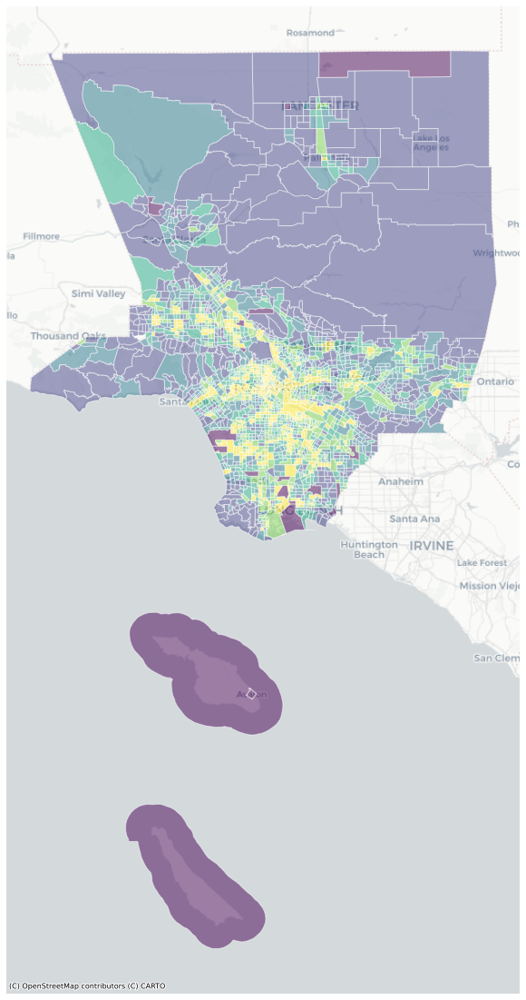

In [58]:
#Use census tracts and ejsm integrated layers to add base map
ax=census_tracts.plot(figsize=(20,20), 
                      edgecolor='white',
                      column='HazScore',
                      alpha=0.5)

ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [59]:
#Make crime GeoDataFrame
crime = gpd.GeoDataFrame(df_flat, 
                         crs='EPSG:4326',
                         geometry=gpd.points_from_xy(df_flat.lon, df_flat.lat))

In [60]:
#Convert crime to crs
crime = crime.to_crs(epsg=3857)
crime.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 25855 entries, 0 to 25854
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   FIPS             25855 non-null  object  
 1   grp_description  25855 non-null  object  
 2   lat              25855 non-null  float64 
 3   lon              25855 non-null  float64 
 4   arst_date        25855 non-null  object  
 5   rpt_id           25855 non-null  int64   
 6   geometry         25855 non-null  geometry
dtypes: float64(2), geometry(1), int64(1), object(3)
memory usage: 1.4+ MB


In [61]:
#Use geometry to define area
crime.geometry.total_bounds

array([-13209059.45803905,   3989526.81108362, -13153488.76823505,
         4072970.3446184 ])

In [62]:
#Print total bounds
minx, miny, maxx, maxy = crime.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13209059.458039049
-13153488.768235046
3989526.8110836204
4072970.344618399


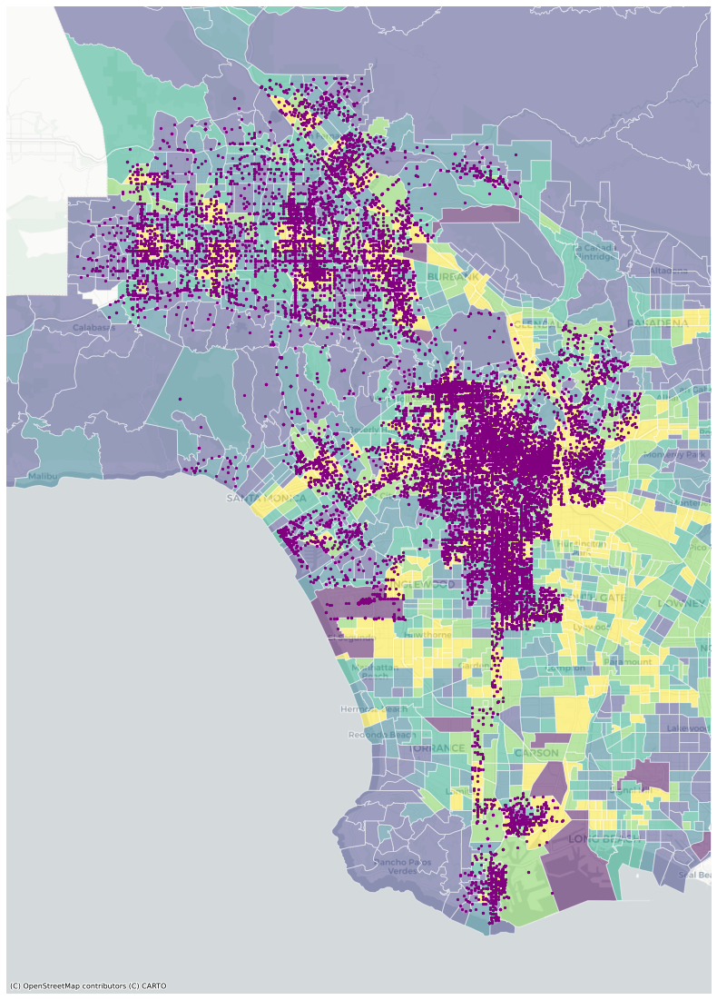

In [63]:
#Configure function map by census tracts as the base map
base = census_tracts.plot(figsize=(20,20), 
                      edgecolor='white',
                      column='HazScore',
                      alpha=0.5)

ax = crime.plot(ax=base, marker='o', color='purple', markersize=5)

ax.set_xlim(minx - 7000, maxx + 7000) 
ax.set_ylim(miny - 7000, maxy + 7000)

ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)


In [64]:
#Define bounds for the map using the function
crime.geometry.total_bounds
minx, miny, maxx, maxy = crime.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13209059.458039049
-13153488.768235046
3989526.8110836204
4072970.344618399


In [65]:
def map_arrests_by_type(charge='Aggravated Assault'):
    
    crime_type = crime[crime.grp_description==charge]

    minx, miny, maxx, maxy = crime_type.geometry.total_bounds
    
    arrests_in_tracts = gpd.sjoin(census_tracts,crime_type,how='right')

    base = census_tracts.plot(figsize=(20,20), 
                    edgecolor='white',
                    column='HazScore',
                    alpha=0.5)

    ax = arrests_in_tracts.plot(ax=base, 
                                    column='grp_description',
                                    marker='o',
                                    markersize=40, 
                                    legend=True,
                                    cmap='tab20',
                                    legend_kwds={
                                       'loc': 'upper right',
                                       'bbox_to_anchor':(1.3,1)
                                    }                  # this puts the legend to the side
                                )

    ax.set_xlim(minx - 200, maxx + 200) # added/substracted value is to give some margin around total bounds
    ax.set_ylim(miny - 200, maxy + 200)

    ax.axis('off')

    ax.set_title('Occurences of '+crime.grp_description.values[0]+' in Los Angeles',fontsize=20)

    ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
    ax

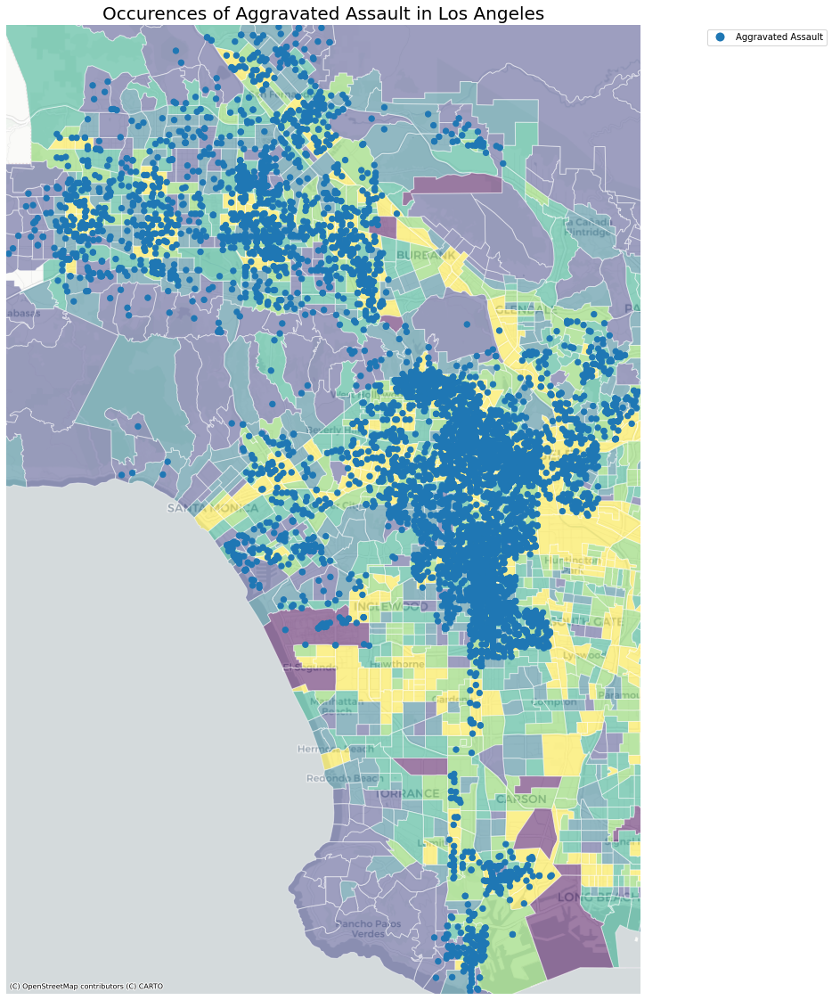

In [66]:
#Map arrests by using the function
map_arrests_by_type(charge='Aggravated Assault')

In [67]:
import seaborn as sns

# to explore point patterns
from pointpats import centrography
from matplotlib.patches import Ellipse
import numpy
# import that interact library
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

In [68]:
#slice datadf
map_arrests_by_type = crime[crime.grp_description== 'Aggravated Assault'].head()

In [69]:
#map arrests by type info- this is a subset of crime ag-- i dont think i understand this
map_arrests_by_type.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 5 entries, 0 to 16
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   FIPS             5 non-null      object  
 1   grp_description  5 non-null      object  
 2   lat              5 non-null      float64 
 3   lon              5 non-null      float64 
 4   arst_date        5 non-null      object  
 5   rpt_id           5 non-null      int64   
 6   geometry         5 non-null      geometry
dtypes: float64(2), geometry(1), int64(1), object(3)
memory usage: 320.0+ bytes


In [70]:
#current df
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28225 entries, 2018 to 28050
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   arst_date        28225 non-null  object  
 1   rpt_id           28225 non-null  object  
 2   grp_description  28225 non-null  object  
 3   arst_typ_cd      28225 non-null  object  
 4   HazScore         28021 non-null  float64 
 5   CIscore          28021 non-null  float64 
 6   FIPS             28021 non-null  object  
 7   lat              28225 non-null  float64 
 8   lon              28225 non-null  float64 
 9   geometry         28225 non-null  geometry
dtypes: float64(4), geometry(1), object(5)
memory usage: 2.4+ MB


In [71]:
#slice data- needs help
df[df.grp_description == 'Aggravated Assault'].head()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry
3917,2020-08-18T00:00:00.000,5994330,Aggravated Assault,F,3.0,10.0,06037101110,34.2588,-118.2979,POINT (-118.29790 34.25880)
19421,2020-03-05T00:00:00.000,5893685,Aggravated Assault,F,3.0,10.0,06037101110,34.2632,-118.2957,POINT (-118.29570 34.26320)
10211,2020-06-09T00:00:00.000,5951608,Aggravated Assault,F,3.0,10.0,06037101110,34.2611,-118.2857,POINT (-118.28570 34.26110)
10707,2020-06-02T00:00:00.000,5947554,Aggravated Assault,F,1.0,4.0,06037101122,34.2655,-118.2931,POINT (-118.29310 34.26550)
16413,2020-04-04T00:00:00.000,5911472,Aggravated Assault,F,1.0,4.0,06037101122,34.2559,-118.2840,POINT (-118.28400 34.25590)


In [72]:
#overloaded 
# table
#display(df[df.grp_description == 'Aggravated Assault'].head()) 

# map
#ax = df[df.grp_description == 'Aggravated Assault'].plot(figsize=(9,9), markersize=1)

# axis
#ax.axis('off')

# basemap
#ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)

In [73]:
#ag converted- gpd points
df = gpd.GeoDataFrame(df, 
                     crs='EPSG:4326',
                     geometry=gpd.points_from_xy(df.lon, df.lat))

In [74]:
df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 28225 entries, 2018 to 28050
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   arst_date        28225 non-null  object  
 1   rpt_id           28225 non-null  object  
 2   grp_description  28225 non-null  object  
 3   arst_typ_cd      28225 non-null  object  
 4   HazScore         28021 non-null  float64 
 5   CIscore          28021 non-null  float64 
 6   FIPS             28021 non-null  object  
 7   lat              28225 non-null  float64 
 8   lon              28225 non-null  float64 
 9   geometry         28225 non-null  geometry
dtypes: float64(4), geometry(1), object(5)
memory usage: 2.4+ MB


In [75]:
#Change df to crs (web mercator for seaborne)
df=df.to_crs('EPSG:3857')

In [76]:
#Make x and y variables with only aggravated assault 
df['x'] = df.geometry.x
df['y'] = df.geometry.y
df[df.grp_description == 'Aggravated Assault'].head()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry,x,y
3917,2020-08-18T00:00:00.000,5994330,Aggravated Assault,F,3.0,10.0,06037101110,34.2588,-118.2979,POINT (-13168861.990 4063605.707),-1.316886e+07,4.063606e+06
19421,2020-03-05T00:00:00.000,5893685,Aggravated Assault,F,3.0,10.0,06037101110,34.2632,-118.2957,POINT (-13168617.087 4064198.346),-1.316862e+07,4.064198e+06
10211,2020-06-09T00:00:00.000,5951608,Aggravated Assault,F,3.0,10.0,06037101110,34.2611,-118.2857,POINT (-13167503.892 4063915.492),-1.316750e+07,4.063915e+06
10707,2020-06-02T00:00:00.000,5947554,Aggravated Assault,F,1.0,4.0,06037101122,34.2655,-118.2931,POINT (-13168327.656 4064508.147),-1.316833e+07,4.064508e+06
16413,2020-04-04T00:00:00.000,5911472,Aggravated Assault,F,1.0,4.0,06037101122,34.2559,-118.2840,POINT (-13167314.649 4063215.120),-1.316731e+07,4.063215e+06


In [77]:
#data mini 
data_mini = df[df.grp_description.isin(['Aggravated Assault'])]
data_mini.head()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry,x,y
3917,2020-08-18T00:00:00.000,5994330,Aggravated Assault,F,3.0,10.0,06037101110,34.2588,-118.2979,POINT (-13168861.990 4063605.707),-1.316886e+07,4.063606e+06
19421,2020-03-05T00:00:00.000,5893685,Aggravated Assault,F,3.0,10.0,06037101110,34.2632,-118.2957,POINT (-13168617.087 4064198.346),-1.316862e+07,4.064198e+06
10211,2020-06-09T00:00:00.000,5951608,Aggravated Assault,F,3.0,10.0,06037101110,34.2611,-118.2857,POINT (-13167503.892 4063915.492),-1.316750e+07,4.063915e+06
10707,2020-06-02T00:00:00.000,5947554,Aggravated Assault,F,1.0,4.0,06037101122,34.2655,-118.2931,POINT (-13168327.656 4064508.147),-1.316833e+07,4.064508e+06
16413,2020-04-04T00:00:00.000,5911472,Aggravated Assault,F,1.0,4.0,06037101122,34.2559,-118.2840,POINT (-13167314.649 4063215.120),-1.316731e+07,4.063215e+06


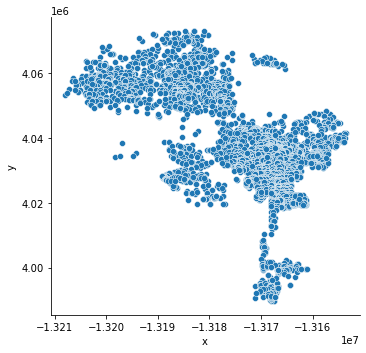

In [78]:
#uses xand y from mini
sns.relplot(data=data_mini,
            x='x', 
            y='y')

In [79]:
#Interactive seaborne map
@interact
def sns_styles(style=['darkgrid', 'whitegrid', 'dark', 'white', 'ticks']):
    # seaborn comes with themes to make them prettier
    sns.set_style(style)

    # scatterplot 
    sns.relplot(data=data_mini,
                x='x', 
                y='y')

interactive(children=(Dropdown(description='style', options=('darkgrid', 'whitegrid', 'dark', 'white', 'ticks'…

In [80]:
#Find centrography of map
mean_center = centrography.mean_center(df[['x','y']])
med_center = centrography.euclidean_median(df[['x','y']])

From this point on we attempt to figure out the median and mean point of our data. These will help us identify where the central tendency of the crimes occur. As we start to explore this data key hubs and center points start to become apparent. With further insight a lot of these hubs are linked to key contaminant sites and align 

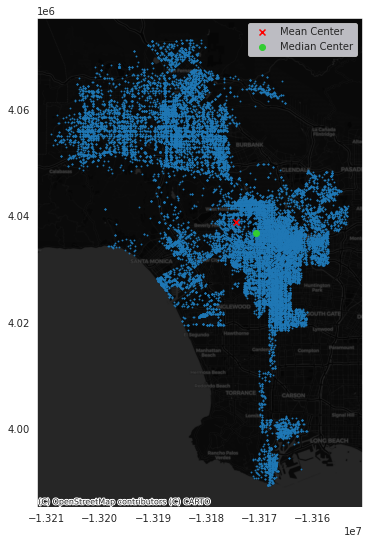

In [81]:
#map the mean center and median center of map
sns.set_style('dark')

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# Plot points
ax.scatter(df['x'], df['y'], s=0.75)
ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

ax.legend()

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)
# Display
plt.show()

In [82]:
#set orientation
major, minor, rotation = centrography.ellipse(df[['x','y']])

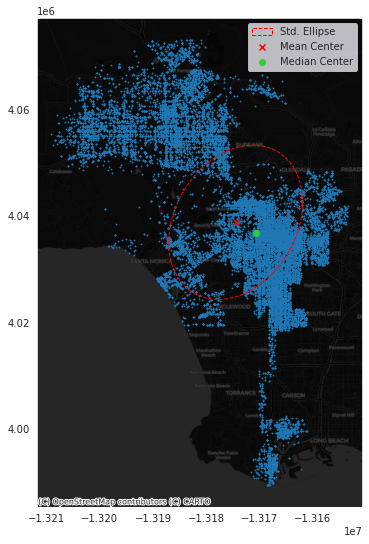

In [83]:
# set the style without grid lines- 
sns.set_style('dark')

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# Plot points
ax.scatter(df['x'], df['y'], s=0.75)
ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

# Construct the standard ellipse using matplotlib
ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                  width=major*2, # centrography.ellipse only gives half the axis
                  height=minor*2, 
                  angle = numpy.rad2deg(rotation), # Angles for this are in degrees, not radians
                  facecolor='none', 
                  edgecolor='red', linestyle='--',
                  label='Std. Ellipse')

ax.add_patch(ellipse)

ax.legend()

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)

# Display
plt.show()

This map displays the concentration of arrests with the median center and mean center. The ellipse provides a general idea about the concentration of charges. However, it is better to use the median for our analysis going forward to avoid the outliers. 

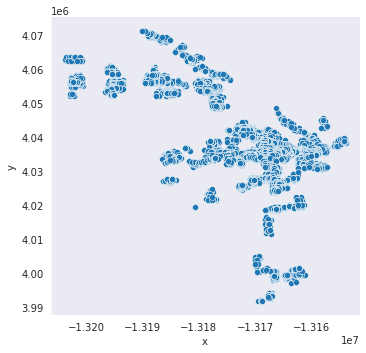

In [84]:
#clusters show all crimes in tracts where the haz score is greater than 4
sns.relplot(data=df[df['HazScore']>4],
            x='x', 
            y='y')

This plot describes are crimes where hazscores are above four

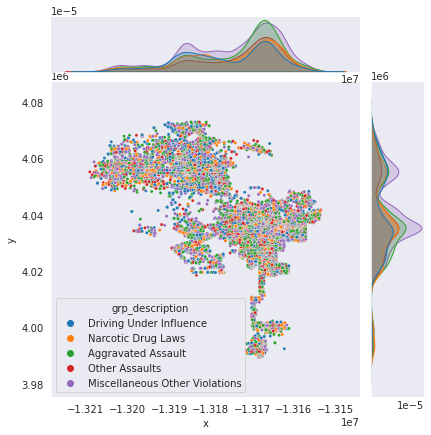

In [85]:
#Seaborne map 
g = sns.jointplot(data = df,
                  x='x', 
                  y='y',
                  hue='grp_description',
                  s=10)

This seaborn plot shows the concentration of different charge types in Los Angeles. On the sides of the map, we can see how the concentrations are higher in areas closer to the center of the map. Instances of aggravated assualt are higher in central LA. Despite not having a basemap, this KDE plot is useful in renderin an overall view that describes the distribution of charges. 

In [86]:
#make df to gdf from hazscore per tract estimation? to normalize data?
df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 28225 entries, 2018 to 28050
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   arst_date        28225 non-null  object  
 1   rpt_id           28225 non-null  object  
 2   grp_description  28225 non-null  object  
 3   arst_typ_cd      28225 non-null  object  
 4   HazScore         28021 non-null  float64 
 5   CIscore          28021 non-null  float64 
 6   FIPS             28021 non-null  object  
 7   lat              28225 non-null  float64 
 8   lon              28225 non-null  float64 
 9   geometry         28225 non-null  geometry
 10  x                28225 non-null  float64 
 11  y                28225 non-null  float64 
dtypes: float64(6), geometry(1), object(5)
memory usage: 2.8+ MB


In [87]:
#this is where we had trouble with the ratio
#ratio is lacking the multiploygon framing for base map for chloropleth 
#could be a problem without the column names named
#problem is that the haz score is not by 1000s 
#STEPS
#define gdf
#figure out pop and reduce it by FIPS

#code

#gdf['g'] = gdf['arrests_per_HazScore']/gdf['TotalPop']*10


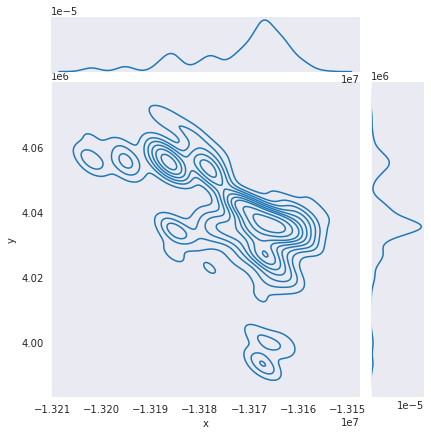

In [88]:
#exploration with hazscore 
sns.jointplot(data=df[df['HazScore']>4],
              x='x', 
              y='y', 
              kind='kde')
ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)

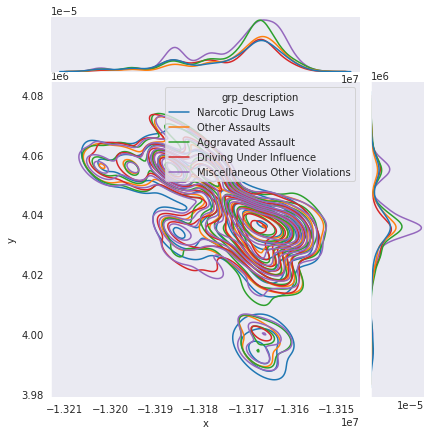

In [89]:
#exploration with hazscore- need to figure out how to explore this better. change Hazscore? create ratio? isolate grp description for crie 
sns.jointplot(data=df[df['HazScore']>4],
              x='x', 
              y='y', 
              kind='kde',
              hue='grp_description')
ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)

In [90]:
#check df
df.head()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry,x,y
2018,2020-09-04T00:00:00.000,6005984,Driving Under Influence,M,3.0,10.0,06037101110,34.2567,-118.3002,POINT (-13169118.025 4063322.867),-1.316912e+07,4.063323e+06
22271,2020-02-13T00:00:00.000,201605850,Narcotic Drug Laws,M,3.0,10.0,06037101110,34.2575,-118.3010,POINT (-13169207.080 4063430.614),-1.316921e+07,4.063431e+06
3917,2020-08-18T00:00:00.000,5994330,Aggravated Assault,F,3.0,10.0,06037101110,34.2588,-118.2979,POINT (-13168861.990 4063605.707),-1.316886e+07,4.063606e+06
4194,2020-08-15T00:00:00.000,5992659,Driving Under Influence,F,3.0,10.0,06037101110,34.2560,-118.2932,POINT (-13168338.788 4063228.588),-1.316834e+07,4.063229e+06
1387,2020-09-10T00:00:00.000,6009503,Other Assaults,M,3.0,10.0,06037101110,34.2578,-118.2932,POINT (-13168338.788 4063471.020),-1.316834e+07,4.063471e+06


In [106]:
@interact
def charge_ellipse(charge=df.grp_description.unique().tolist()):
    # filter the data by race
    charge_filtered = df[df.grp_description == charge]

    # mean center and median
    mean_center = centrography.mean_center(charge_filtered[['x','y']])
    med_center = centrography.euclidean_median(charge_filtered[['x','y']])

    # standard ellipse
    major, minor, rotation = centrography.ellipse(charge_filtered[['x','y']])

    # Set up figure and axis
    f, ax = plt.subplots(1, figsize=(9, 9))

    # plot arrest points
    ax.scatter(charge_filtered['x'], charge_filtered['y'], s=0.75)

    # add the mean and median center points
    ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
    ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

    # heatmap
    sns.kdeplot(x = charge_filtered.geometry.x, 
                y = charge_filtered.geometry.y,
                n_levels=20, 
                shade=False,
                thresh=0.1,
                alpha=0.3, 
                cmap='Reds', 
                ax=ax)

    # Construct the standard ellipse using matplotlib
    ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                      width=major*2, # centrography.ellipse db_filtered
                      height=minor*2, 
                      angle = numpy.rad2deg(rotation), # Angles for this are in degrees, not radians
                      facecolor='none', 
                      edgecolor='red', linestyle='--',
                      label='Std. Ellipse')

    ax.add_patch(ellipse)

    ax.legend()

    ax.axis('Off')

    ax.set_title(str(len(charge_filtered)) + ' incidents of crime by distribution of crime type "' + charge + '"') #CHANGE HERE

    # add a basemap
    ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)
    # Display
    plt.show()

interactive(children=(Dropdown(description='charge', options=('Driving Under Influence', 'Narcotic Drug Laws',…

This heatmap displays the concentration of arrests with the median center and mean center. In the next stage of our final project we want to understand if there is a correlation between crimes by type and the proximity to hazards. It starts to become apparent through different crimes the rise of central nodes throughout the map with consistency. What makes these hubs particularly unique? What is their proximity to hazards and other envionrmental issues? 

In [92]:
#convert df to crs 
df=df.to_crs(epsg=3857)

In [93]:
#convert floats
df.lon = df.lon.astype('float')
df.lat = df.lat.astype('float')

In [94]:
df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 28225 entries, 2018 to 28050
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   arst_date        28225 non-null  object  
 1   rpt_id           28225 non-null  object  
 2   grp_description  28225 non-null  object  
 3   arst_typ_cd      28225 non-null  object  
 4   HazScore         28021 non-null  float64 
 5   CIscore          28021 non-null  float64 
 6   FIPS             28021 non-null  object  
 7   lat              28225 non-null  float64 
 8   lon              28225 non-null  float64 
 9   geometry         28225 non-null  geometry
 10  x                28225 non-null  float64 
 11  y                28225 non-null  float64 
dtypes: float64(6), geometry(1), object(5)
memory usage: 2.8+ MB


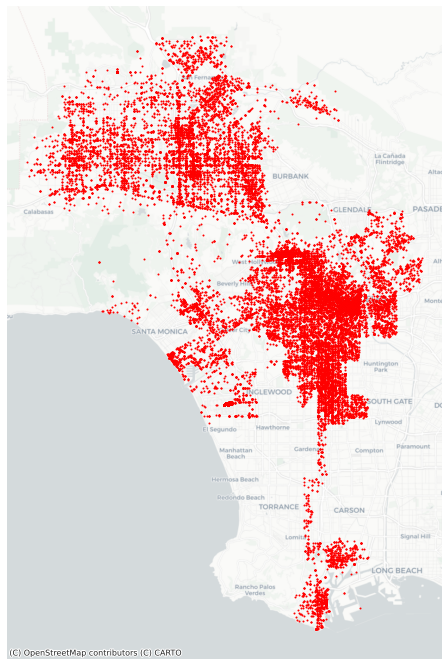

In [95]:
#plot concentrations on map with base
ax= df.plot(figsize=(12,12),
            color='red',
            markersize=1)
            
ax.axis('off')
            
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [96]:
#find bounds
minx, miny, maxx, maxy = df.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13209059.458039049
-13153488.768235046
3989526.8110836204
4072970.344618399


In [97]:
#THIS IS WHERE WE START EXPLORATION FOR OPTION 1
#we are attempting to start the spatial auto correlation for our final :)
map_arrests_by_type.info

<bound method DataFrame.info of            FIPS     grp_description      lat       lon  \
0   06037101110  Aggravated Assault  34.2588 -118.2979   
1   06037101110  Aggravated Assault  34.2611 -118.2857   
2   06037101110  Aggravated Assault  34.2632 -118.2957   
15  06037101122  Aggravated Assault  34.2559 -118.2840   
16  06037101122  Aggravated Assault  34.2655 -118.2931   

                  arst_date  rpt_id                           geometry  
0   2020-08-18T00:00:00.000       1  POINT (-13168861.990 4063605.707)  
1   2020-06-09T00:00:00.000       1  POINT (-13167503.892 4063915.492)  
2   2020-03-05T00:00:00.000       1  POINT (-13168617.087 4064198.346)  
15  2020-04-04T00:00:00.000       1  POINT (-13167314.649 4063215.120)  
16  2020-06-02T00:00:00.000       1  POINT (-13168327.656 4064508.147)  >

In [98]:
#make gdf from df
gdf = df

In [99]:
gdf.head()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry,x,y
2018,2020-09-04T00:00:00.000,6005984,Driving Under Influence,M,3.0,10.0,06037101110,34.2567,-118.3002,POINT (-13169118.025 4063322.867),-1.316912e+07,4.063323e+06
22271,2020-02-13T00:00:00.000,201605850,Narcotic Drug Laws,M,3.0,10.0,06037101110,34.2575,-118.3010,POINT (-13169207.080 4063430.614),-1.316921e+07,4.063431e+06
3917,2020-08-18T00:00:00.000,5994330,Aggravated Assault,F,3.0,10.0,06037101110,34.2588,-118.2979,POINT (-13168861.990 4063605.707),-1.316886e+07,4.063606e+06
4194,2020-08-15T00:00:00.000,5992659,Driving Under Influence,F,3.0,10.0,06037101110,34.2560,-118.2932,POINT (-13168338.788 4063228.588),-1.316834e+07,4.063229e+06
1387,2020-09-10T00:00:00.000,6009503,Other Assaults,M,3.0,10.0,06037101110,34.2578,-118.2932,POINT (-13168338.788 4063471.020),-1.316834e+07,4.063471e+06


In [100]:
#reset index to include counts
arrests_by_gdf = gdf.FIPS.value_counts().rename_axis('FIPS').reset_index(name='arrests_count')

In [101]:
arrests_by_gdf.head()

,FIPS,arrests_count
0,06037980028,699
1,06037206300,487
2,06037207710,262
3,06037207400,231
4,06037128210,224


In [102]:
#merge arrests by FIPS to find the arrest counts to see the average in each FIPS by hazscore
gdf=gdf.merge(arrests_by_gdf,on='FIPS')
gdf.tail()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry,x,y,arrests_count
28016,2020-07-19T00:00:00.000,5974608,Aggravated Assault,F,4.0,7.0,06037980031,33.7167,-118.2842,POINT (-13167336.913 3990824.897),-1.316734e+07,3.990825e+06,80
28017,2020-09-18T00:00:00.000,6014843,Other Assaults,M,4.0,7.0,06037980031,33.7167,-118.2842,POINT (-13167336.913 3990824.897),-1.316734e+07,3.990825e+06,80
28018,2020-04-24T00:00:00.000,5920521,Other Assaults,M,4.0,7.0,06037980031,33.7167,-118.2842,POINT (-13167336.913 3990824.897),-1.316734e+07,3.990825e+06,80
28019,2020-08-15T00:00:00.000,5992477,Aggravated Assault,F,4.0,7.0,06037980031,33.7167,-118.2842,POINT (-13167336.913 3990824.897),-1.316734e+07,3.990825e+06,80
28020,2020-02-02T00:00:00.000,5864491,Narcotic Drug Laws,M,4.0,7.0,06037980031,33.7167,-118.2842,POINT (-13167336.913 3990824.897),-1.316734e+07,3.990825e+06,80


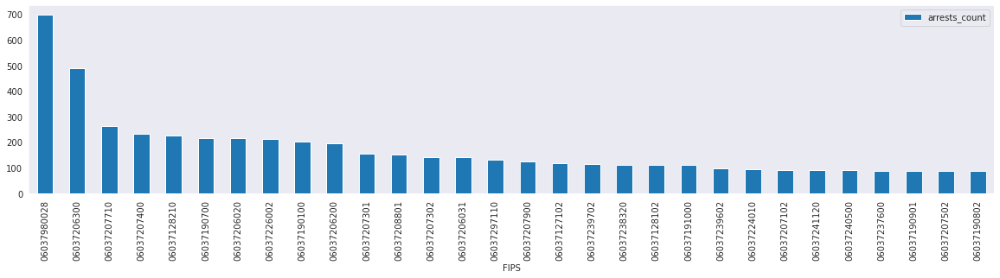

In [103]:
#describe arrests per FIPS
arrests_by_gdf[:30].plot.bar(figsize=(20,4),
                             x='FIPS',
                             y='arrests_count')

In [104]:
#gdf of arrests by hazscore ratio
gdf['arrests_per_HazScore'] = gdf['arrests_count']/gdf['HazScore']*100
gdf.sort_values(by="arrests_per_HazScore").head()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry,x,y,arrests_count,arrests_per_HazScore
26895,2020-03-06T00:00:00.000,5894774,Miscellaneous Other Violations,F,5.0,17.0,06037601401,33.9527,-118.3770,POINT (-13177667.362 4022452.559),-1.317767e+07,4.022453e+06,1,20.000000
26950,2020-04-14T00:00:00.000,5915148,Aggravated Assault,F,4.0,14.0,06037700200,34.0945,-118.3616,POINT (-13175953.041 4041498.137),-1.317595e+07,4.041498e+06,1,25.000000
26033,2020-06-04T00:00:00.000,5949034,Narcotic Drug Laws,F,4.0,12.0,06037543703,33.7988,-118.2714,POINT (-13165912.023 4001817.672),-1.316591e+07,4.001818e+06,1,25.000000
25805,2020-02-16T00:00:00.000,5877171,Miscellaneous Other Violations,O,4.0,16.0,06037602900,33.9123,-118.2916,POINT (-13168160.677 4017032.129),-1.316816e+07,4.017032e+06,1,25.000000
26951,2020-02-18T00:00:00.000,5878468,Aggravated Assault,F,3.0,11.0,06037700400,34.0820,-118.3703,POINT (-13176921.521 4039817.944),-1.317692e+07,4.039818e+06,1,33.333333


In [105]:

arrests[arrests.lon==0]

NameError: name 'arrests' is not defined

Up to this point we have been able to create various maps that overlay the data but we have yet to conclusively identify a statistical correlation between crime and hazards. Moving forward we will create a Moran plot and identify the central tendencies of the map through autocorrelation learned in week 8. 

Description of labor:
AG: fixed the sample size of data and did explorations with the heatmap and KDE plot
DH:seaborn maps and data exploration